In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D, MaxPooling2D, BatchNormalization, Dropout, Reshape, Concatenate, LeakyReLU
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model

In [2]:
#height and width refer to the size of the image
#channels refers to the amoitn of color channels
image_dimensions={'height':256,'width':256,'channels':3}

In [3]:
#creat a classifier class

class Classifier:
    def __init__():
        self.model=0
    def predict(self,x):
        return self.model.predict(x)
    def fit(self,x,y):
        return self.model.train_on_batch(x,y)

    def get_accuracy(self,x,y):
        return self.model.test_on_batch(x,y)

    def load(self,path):
        self.model.load_weights(path)

In [4]:
#create a MesoNet class using the classifier

class Meso4(Classifier):
    def __init__(self,learning_rate=0.001):
        self.model=self.init_model()
        optimizer=Adam(lr=learning_rate)
        self.model.compile(optimizer=optimizer,
                          loss='mean_squared_error',
                          metrics=['accuracy'])
    #create our architecture
    def init_model(self):
        x=Input(shape=(image_dimensions['height'],image_dimensions['width'],
                      image_dimensions['channels']))
        x1=Conv2D(8,(3,3),padding='same',activation='relu')(x)
        x1=BatchNormalization()(x1)
        x1=MaxPooling2D(pool_size=(2,2),padding='same')(x1)

        x2=Conv2D(8,(5,5),padding='same',activation='relu')(x1)
        x2=BatchNormalization()(x2)
        x2=MaxPooling2D(pool_size=(2,2),padding='same')(x2)

        x3=Conv2D(16,(5,5),padding='same',activation='relu')(x2)
        x3=BatchNormalization()(x3)
        x3=MaxPooling2D(pool_size=(2,2),padding='same')(x3)

        x4=Conv2D(16,(5,5),padding='same',activation='relu')(x3)
        x4=BatchNormalization()(x4)
        x4=MaxPooling2D(pool_size=(4,4),padding='same')(x4)

        #batch normalization is to perform speed
        #normalize the inputs to each layer of the network
        #pooling layer: reduce dimensions to decrease speed of computation: max pooling is by taking the max value of the region of pixels

        y=Flatten()(x4)
        y=Dropout(0.5)(y)
        y=Dense(16)(y)
        y=LeakyReLU(alpha=0.1)(y)
        y=Dropout(0.5)(y)
        y=Dense(1,activation='sigmoid')(y)
        return Model(inputs=x,outputs=y)

In [7]:
#instantiate the mesonet model with pretrained weights
meso=Meso4()
meso.load('/content/Meso4_DF (2)')

In [11]:
!pip install zipfile

ERROR: Could not find a version that satisfies the requirement zipfile (from versions: none)
ERROR: No matching distribution found for zipfile


In [12]:
!unzip -j /content/celeb-df.zip

Archive:  /content/celeb-df.zip
  inflating: easy_100_1111.jpg       
  inflating: easy_101_0010.jpg       
  inflating: easy_102_0101.jpg       
  inflating: easy_103_1111.jpg       
  inflating: easy_105_1100.jpg       
  inflating: easy_106_0011.jpg       
  inflating: easy_107_1011.jpg       
  inflating: easy_108_1111.jpg       
  inflating: easy_110_0001.jpg       
  inflating: easy_111_1101.jpg       
  inflating: easy_112_1001.jpg       
  inflating: easy_113_0011.jpg       
  inflating: easy_115_0010.jpg       
  inflating: easy_116_111.jpg        
  inflating: easy_117_0101.jpg       
  inflating: easy_118_1111.jpg       
  inflating: easy_120_0011.jpg       
  inflating: easy_121_0011.jpg       
  inflating: easy_122_1011.jpg       
  inflating: easy_123_0100.jpg       
  inflating: easy_125_0011.jpg       
  inflating: easy_126_0111.jpg       
  inflating: easy_127_0001.jpg       
  inflating: easy_128_0111.jpg       
  inflating: easy_130_1101.jpg       
  inflating: easy_

In [16]:
!pip install unzipper

  Preparing metadata (setup.py) ... done
  Created wheel for unzipper: filename=unzipper-1.11-py3-none-any.whl size=1816 sha256=c53293f373aafb671a16bb1c9cf2e8f2ab90499ad346ca8704320aaba318f51a
  Stored in directory: /root/.cache/pip/wheels/c1/d9/51/57fcd531ba0a0c6de39150dc9ce01112e2bb26d1cb7a338244
Successfully built unzipper


In [17]:
import os
import zipfile

with zipfile.ZipFile('/content/celeb-df.zip', 'r') as zip_ref:
    zip_ref.extractall('/content')

In [18]:
#prepare the dataset
#rescaling pixel values between 1 and 255 to a range between 0 and 1
dataGenerator=ImageDataGenerator(rescale=1./255)

#instantiating generator to feed images through the network
generator=dataGenerator.flow_from_directory('/content/celeb-df',
                                           target_size=(256,256),
                                           batch_size=1,
                                           class_mode='binary')

Found 165 images belonging to 2 classes.


In [19]:
#cheking class assignment
generator.class_indices

{'Fake': 0, 'Real': 1}

1/1 [==============================] - 1s 541ms/step
Predicted likelihood:0.9987
Actual label:0
1/1 [==============================] - 0s 90ms/step

Correct prediction:False


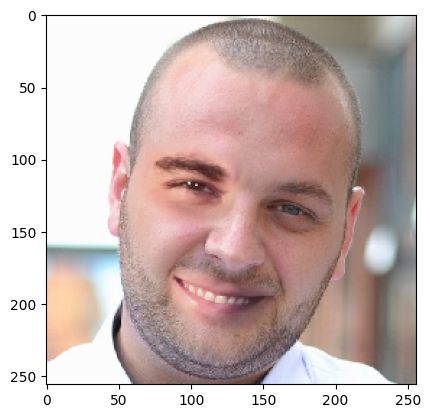

In [20]:
#Rendering image X with label y for MesoNet
X,y=generator.next()
#Evaluating prediction
print(f"Predicted likelihood:{meso.predict(X)[0][0]:.4f}")
print(f"Actual label:{int(y[0])}")
print(f"\nCorrect prediction:{round(meso.predict(X)[0][0])==y[0]}")

#showing image
#our data has currentlu an extra dimension for its position in the batch and this needs to be removed before imshow so that it can properly render the image
#this is why we use the numpy function squeeze
plt.imshow(np.squeeze(X))

In [21]:
#creating separate lists for correctly classified and misclassified images
correct_real=[]
correct_real_pred=[]

correct_deepfake=[]
correct_deepfake_pred=[]

misclassified_real=[]
misclassified_real_pred=[]

misclassified_deepfake=[]
misclassified_deepfake_pred=[]

In [22]:
# Generating predictions on validation set, storing in separate lists
for i in range(len(generator.labels)):

    # Loading next picture, generating prediction
    X, y = generator.next()
    pred = meso.predict(X)[0][0]

    # Sorting into proper category
    if round(pred)==y[0] and y[0]==1:
        correct_real.append(X)
        correct_real_pred.append(pred)
    elif round(pred)==y[0] and y[0]==0:
        correct_deepfake.append(X)
        correct_deepfake_pred.append(pred)
    elif y[0]==1:
        misclassified_real.append(X)
        misclassified_real_pred.append(pred)
    else:
        misclassified_deepfake.append(X)
        misclassified_deepfake_pred.append(pred)

    # Printing status update
    if i % 1000 == 0:
        print(i, ' predictions completed.')

    if i == len(generator.labels)-1:
        print("All", len(generator.labels), "predictions completed")

1/1 [==============================] - 0s 35ms/step
0  predictions completed.
1/1 [==============================] - 0s 41ms/step
All 165 predictions completed


In [23]:
def plotter(images,preds):
    fig=plt.figure(figsize=(16,9))
    subset=np.random.randint(0,len(images)-1,12)
    for i,j in enumerate(subset):
        fig.add_subplot(3,4,i+1)
        plt.imshow(np.squeeze(images[j]))
        plt.xlabel(f"Model confidence: \n{preds[j]:.4f}")
        plt.tight_layout()
        ax=plt.gca()
        ax.axes.xaxis.set_ticks([])
        ax.axes.yaxis.set_ticks([])
    plt.show
    return

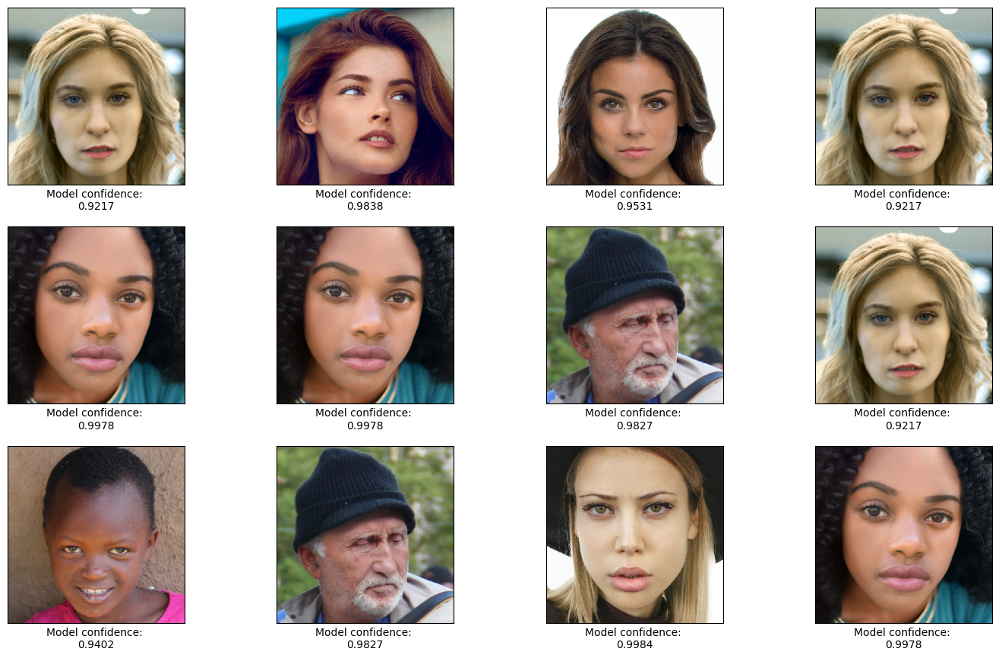

In [24]:
plotter(correct_real,correct_real_pred)

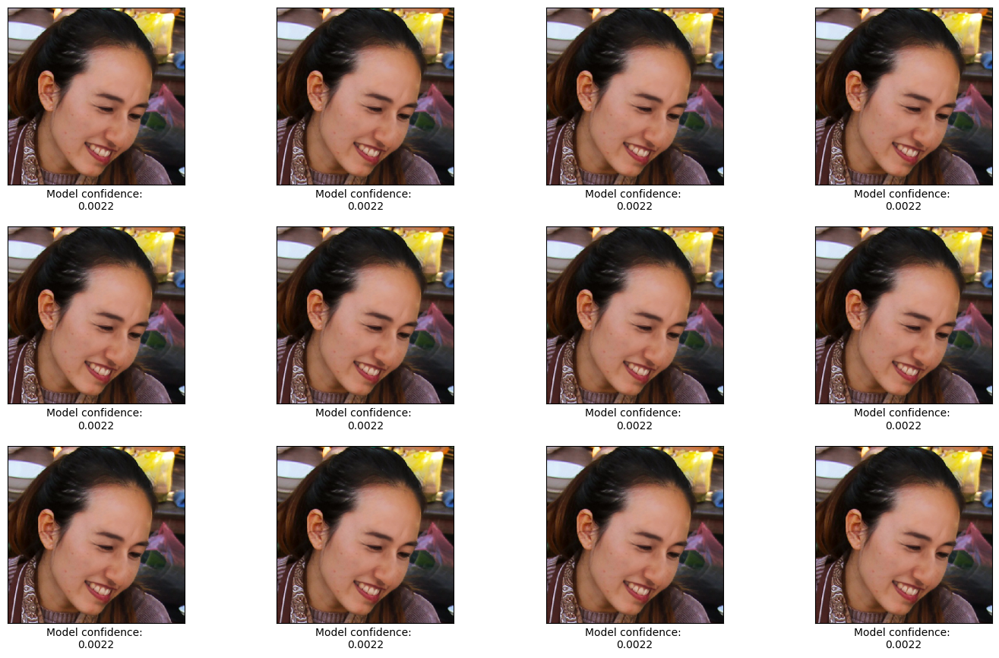

In [25]:
plotter(misclassified_real,misclassified_real_pred)

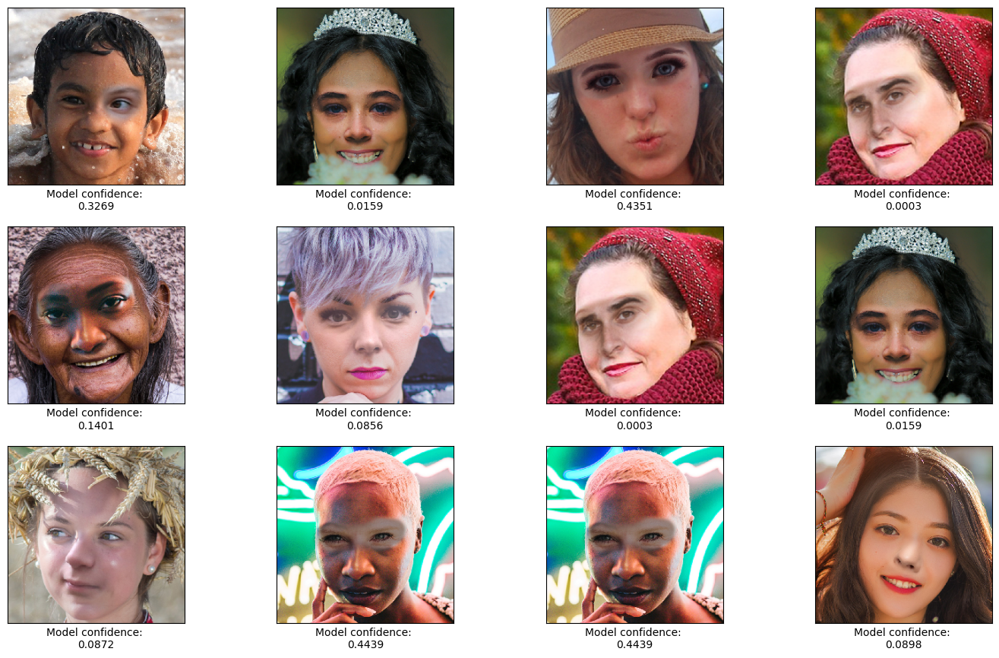

In [26]:
#correctly identified deepfakes
plotter(correct_deepfake,correct_deepfake_pred)

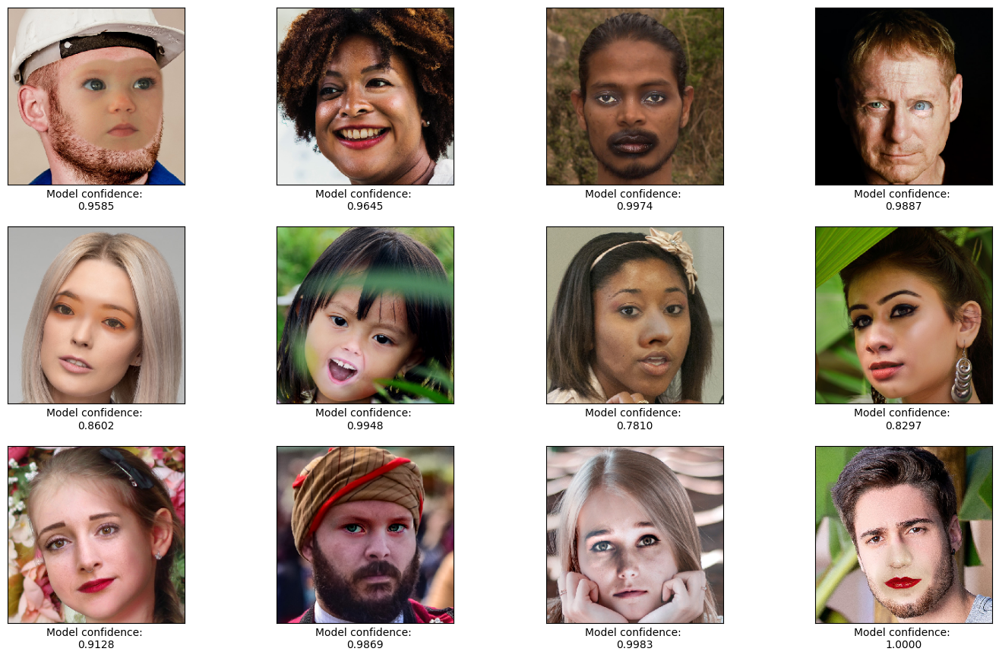

In [27]:
plotter(misclassified_deepfake,misclassified_deepfake_pred)

In [29]:
!ls

 celeb-df	     easy_140_1111.jpg	 easy_176_1000.jpg   easy_210_1011.jpg	 easy_76_1111.jpg
 celeb-df.zip	     easy_141_0111.jpg	 easy_177_1010.jpg   easy_211_1100.jpg	 easy_77_0111.jpg
 easy_100_1111.jpg   easy_142_1111.jpg	 easy_178_1111.jpg   easy_212_0010.jpg	 easy_78_1111.jpg
 easy_101_0010.jpg   easy_143_0011.jpg	 easy_179_0001.jpg   easy_213_1111.jpg	 easy_80_0001.jpg
 easy_102_0101.jpg   easy_145_1000.jpg	 easy_180_0011.jpg   easy_214_0011.jpg	 easy_81_1111.jpg
 easy_103_1111.jpg   easy_146_1110.jpg	 easy_181_1110.jpg   easy_215_1111.jpg	 easy_82_0001.jpg
 easy_105_1100.jpg   easy_147_1110.jpg	 easy_182_0100.jpg   easy_216_1100.jpg	 easy_83_1110.jpg
 easy_106_0011.jpg   easy_148_0011.jpg	 easy_183_1111.jpg   easy_217_1111.jpg	 easy_84_0011.jpg
 easy_107_1011.jpg   easy_150_0011.jpg	 easy_184_0110.jpg   easy_218_0011.jpg	 easy_85_1111.jpg
 easy_108_1111.jpg   easy_151_1110.jpg	 easy_185_1101.jpg   easy_219_1101.jpg	 easy_86_0011.jpg
 easy_110_0001.jpg   easy_152_0011.jpg	 easy_186

In [36]:
!pip install Pillow

In [32]:
from PIL import Image

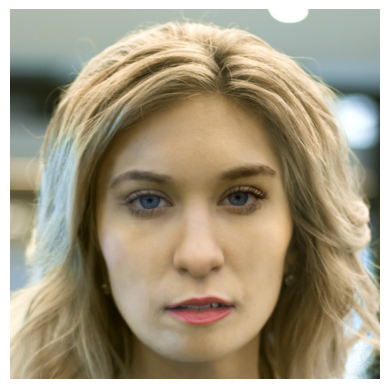

In [39]:
#let's show an image which is fake
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Specify the path to your image file
image_path = "hard_9_1111.jpg"

# Load the image
image = mpimg.imread(image_path)

# Plot the image
plt.imshow(image)
plt.axis('off')  # Turn off axis labels
plt.show()

In [40]:
#let's use mesonet to predict on this image
image.shape

(600, 600, 3)

In [44]:
from PIL import Image

In [45]:
image = Image.open("hard_9_1111.jpg")

In [47]:
resized_image_path = "/content/sample_data/resized"

In [50]:
import os

# Create a directory to store the resized images
!mkdir resized_images

# Set the directory path
resized_image_path = os.path.join("resized_images", "resized_image.jpg")

# Open the image
image = Image.open("hard_9_1111.jpg")

# Resize the image
image = image.resize((256, 256))

# Save the image
image.save(resized_image_path)

In [51]:
image.save(resized_image_path, format="PNG")

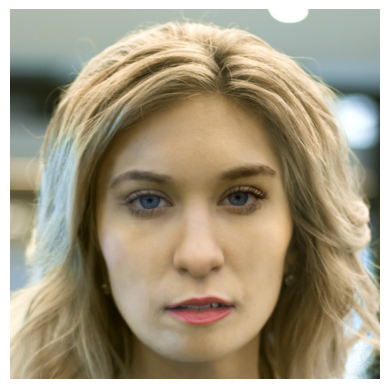

In [54]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Specify the path to your image file
image_path = "hard_9_1111.jpg"

# Load the image
image = mpimg.imread(image_path)

# Plot the image
plt.imshow(image)
plt.axis('off')  # Turn off axis labels
plt.show()

In [55]:
image.shape

(600, 600, 3)

In [57]:
meso.model.input_shape

(None, 256, 256, 3)

In [60]:
print(type(meso.model.input_shape))

<class 'tuple'>


In [61]:
print(meso.model.input_shape)

(None, 256, 256, 3)


In [65]:
import numpy as np
image = np.expand_dims(image, axis=0)

In [67]:
print(image.shape)

(1, 600, 600, 3)


In [70]:
resized_image = image.img_to_array(Image.open('hard_9_1111.jpg').resize((256, 256)))

In [72]:
print(type(meso))

<class '__main__.Meso4'>


In [73]:
help(meso.predict)

Help on method predict in module __main__:

predict(x) method of __main__.Meso4 instance



In [75]:
image = np.array(image)

In [77]:
print(type(image))
print(image.shape)

<class 'numpy.ndarray'>
()


In [78]:
print(type(meso))
print(meso.model)

<class '__main__.Meso4'>


In [79]:
print(meso.predict.__doc__)

None


In [83]:
# Load the image
image = mpimg.imread(image_path)

In [86]:
import tensorflow as tf

In [88]:
print(image.shape)

(600, 600, 3)


In [93]:
# Resize the image tensor
image = tf.image.resize(image, (256, 256))

In [94]:
print(image.shape)

(1, 256, 256, 3)


In [95]:
pred = meso.predict(image)[0][0]

1/1 [==============================] - 0s 41ms/step


In [97]:
from PIL import Image
import numpy as np
# Specify the path to your image file
image_path = "/content/hard_13_1111.jpg"
# Open the image
image = Image.open(image_path)

# Resize the image to the desired dimensions
image = image.resize((256, 256))

# Convert the image to a NumPy array
image_array = np.array(image)

# Reshape the image array to include the batch dimension
image_array = image_array.reshape((1, 256, 256, 3))
resized_image_path = "/content/sample_data/resized_2"
image.save(resized_image_path + ".jpg")

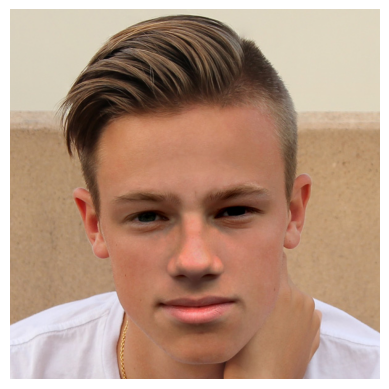

In [98]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Specify the path to your image file
image_path = "/content/hard_13_1111.jpg"
# Load the image
image = mpimg.imread(image_path)

# Plot the image
plt.imshow(image)
plt.axis('off')  # Turn off axis labels
plt.show()

In [99]:
image.shape

(600, 600, 3)

In [103]:
dataGenerator=ImageDataGenerator(rescale=1./255)

#instantiating generator to feed images through the network
generator=dataGenerator.flow_from_directory('/content/celeb-df',
                                           target_size=(256,256),
                                           batch_size=1,
                                           class_mode='binary')

Found 165 images belonging to 2 classes.


In [104]:
generator.class_indices

{'Fake': 0, 'Real': 1}

In [105]:
im,y=generator.next()
print(f"Predicted likelihood:{meso.predict(im)[0][0]:.4f}")

1/1 [==============================] - 0s 62ms/step
Predicted likelihood:0.9999


1/1 [==============================] - 0s 35ms/step
Predicted likelihood:0.9999
Actual label:0
1/1 [==============================] - 0s 37ms/step

Correct prediction:False


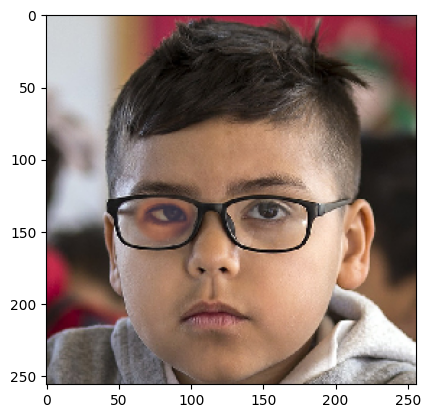

In [106]:
print(f"Predicted likelihood:{meso.predict(im)[0][0]:.4f}")
print(f"Actual label:{int(y[0])}")
print(f"\nCorrect prediction:{round(meso.predict(im)[0][0])==y[0]}")

#showing image
#our data has currentlu an extra dimension for its position in the batch and this needs to be removed before imshow so that it can properly render the image
#this is why we use the numpy function squeeze
plt.imshow(np.squeeze(im))

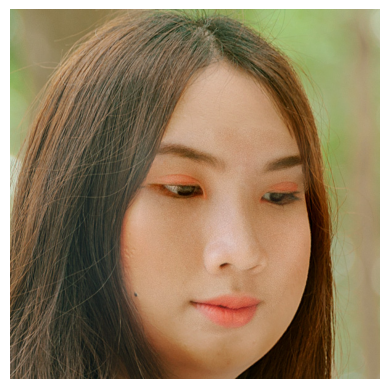

In [107]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Specify the path to your image file
image_path = "/content/easy_100_1111.jpg"

# Load the image
image = mpimg.imread(image_path)

# Plot the image
plt.imshow(image)
plt.axis('off')  # Turn off axis labels
plt.show()

In [122]:
dataGenerator=ImageDataGenerator(rescale=1./255)

#instantiating generator to feed images through the network
generator=dataGenerator.flow_from_directory('/content/celeb-df',
                                           target_size=(256,256),
                                           batch_size=1,
                                           class_mode='binary')

Found 165 images belonging to 2 classes.


In [123]:
generator.class_indices

{'Fake': 0, 'Real': 1}

In [124]:
im,y=generator.next()
print(f"Predicted likelihood:{meso.predict(im)[0][0]:.4f}")

1/1 [==============================] - 0s 48ms/step
Predicted likelihood:0.2645


In [126]:
dataGenerator=ImageDataGenerator(rescale=1./255)

#instantiating generator to feed images through the network
generator=dataGenerator.flow_from_directory('/content/celeb-df',
                                           target_size=(256,256),
                                           batch_size=1,
                                           class_mode='binary')

Found 165 images belonging to 2 classes.


In [127]:
im,y=generator.next()
print(f"Predicted likelihood:{meso.predict(im)[0][0]:.4f}")

1/1 [==============================] - 0s 57ms/step
Predicted likelihood:0.7912


In [128]:
import zipfile
import os
import datetime

In [129]:
zip_path = '/content/celeb-df.zip'
extract_path = '/content/simple_data'  # Change this to the desired extraction path

In [130]:
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

In [134]:
from pathlib import Path
import pandas as pd

In [135]:
image_dir=Path(extract_path)
filepaths= list(image_dir.glob(r'**/*.jpg'))
labels=list(map(lambda x: os.path.split(os.path.split(x)[0])[1],filepaths))
filepaths=pd.Series(filepaths,name='Filepath').astype(str)
labels=pd.Series(labels,name='Label')
image_df=pd.concat([filepaths,labels],axis=1)

In [137]:
!pip install sklearn

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [138]:
from sklearn.model_selection import train_test_split

In [139]:
train_df,test_df=train_test_split(image_df,train_size=0.7,shuffle=True,random_state=1)
train_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)
test_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255
)

In [140]:
train_images=train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224,224),
    color_mode='rgb',
    class_mode='binary',
    batch_size=64,
    shuffle=True,
    seed=42,
    subset='training'
)

Found 92 validated image filenames belonging to 2 classes.


In [141]:
val_images=train_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224,224),
    color_mode='rgb',
    class_mode='binary',
    batch_size=64,
    shuffle=False,
    seed= 42,
    subset='validation'
)

Found 10 validated image filenames belonging to 2 classes.


In [142]:
test_images=test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224,224),
    color_mode='rgb',
    class_mode='binary',
    batch_size=64,
    shuffle=False
)


Found 50 validated image filenames belonging to 2 classes.


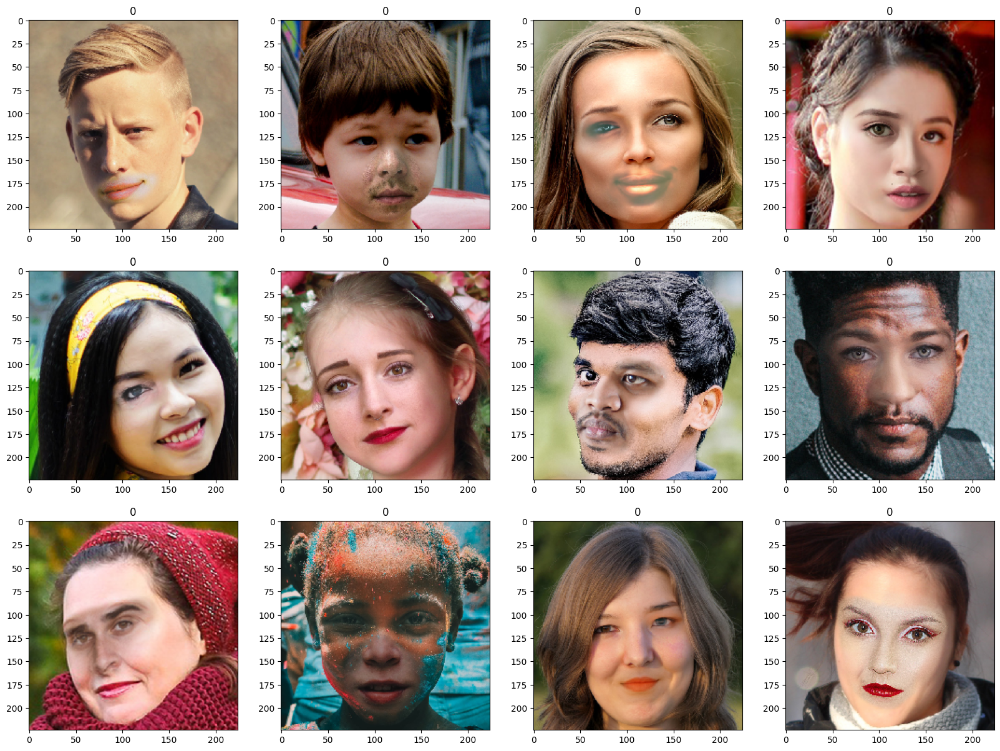

In [143]:
plt.figure(figsize=(20, 20))
for images, labels in train_images:
    for i in range(12):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i])
        plt.title(int(labels[i]))
        plt.axis("on")
    break

In [145]:
!pip install pytorch
!pip install torchvision

  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for pytorch
  Running setup.py clean for pytorch
Failed to build pytorch
ERROR: Could not build wheels for pytorch, which is required to install pyproject.toml-based projects


In [148]:
import torch
import torchvision
import torchvision.models
from torchvision import models

In [155]:
from tensorflow.keras.models import Model

In [156]:
model = Model()

In [159]:
# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy']
)

In [162]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

class MyModel(tf.keras.Model):

    def __init__(self):
        super(MyModel, self).__init__()
        self.conv1 = Conv2D(16, (3, 3), activation='relu')
        self.pool1 = MaxPooling2D((2, 2))
        self.conv2 = Conv2D(32, (3, 3), activation='relu')
        self.pool2 = MaxPooling2D((2, 2))
        self.conv3 = Conv2D(64, (3, 3), activation='relu')
        self.pool3 = MaxPooling2D((2, 2))
        self.conv4 = Conv2D(128, (3, 3), activation='relu')
        self.pool4 = MaxPooling2D((2, 2))
        self.flatten = Flatten()
        self.dropout1 = Dropout(0.5)
        self.dense1 = Dense(128, activation='relu')
        self.dropout2 = Dropout(0.5)
        self.dense2 = Dense(1, activation='sigmoid')

    def call(self, inputs):
        x = self.conv1(inputs)
        x = self.pool1(x)
        x = self.conv2(x)
        x = self.pool2(x)
        x = self.conv3(x)
        x = self.pool3(x)
        x = self.conv4(x)
        x = self.pool4(x)
        x = self.flatten(x)
        x = self.dropout1(x)
        x = self.dense1(x)
        x = self.dropout2(x)
        return self.dense2(x)

# Create an instance of the model
model = MyModel()

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display model summary
model.build((None, 224, 224, 3))  # Specify input shape
model.summary()


Model: "my_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           multiple                  448       
                                                                 
 max_pooling2d_8 (MaxPoolin  multiple                  0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           multiple                  4640      
                                                                 
 max_pooling2d_9 (MaxPoolin  multiple                  0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          multiple                  18496     
                                                                 
 max_pooling2d_10 (MaxPooli  multiple                  0  

In [165]:
print(type(model))

<class '__main__.MyModel'>


In [164]:
!pip install h5py

In [166]:
import h5py

In [168]:
model = tf.keras.Sequential([
    Conv2D(16, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

In [169]:
model.save_weights('my_model_weights.h5')
model.save('140kdfrf_model.h5',  save_format='h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [173]:
!pip install matplotlib
!pip install seaborn

In [174]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [175]:
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [176]:
results=model.evaluate(test_images,verbose=0)

test loss: 0.69108
test acc: 66.00
1/1 [==============================] - 2s 2s/step


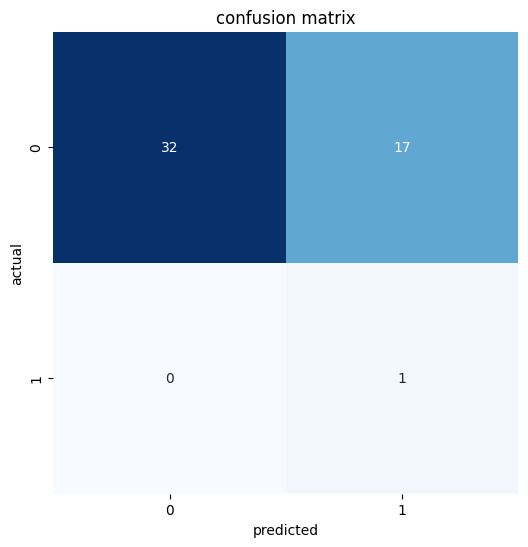

In [177]:
print("test loss: {:.5f}".format(results[0]))
print("test acc: {:.2f}".format(results[1]*100))
predictions=(model.predict(test_images)>=0.5).astype(int)
cm=confusion_matrix(test_images.labels,predictions,labels=[0,1])
plt.figure(figsize=(6,6))
sns.heatmap(cm,annot=True,fmt='g',vmin=0,cmap='Blues',cbar=False)
plt.xticks(ticks=[0.5,1.5],label=["Fake","Real"])
plt.yticks(ticks=[0.5,1.5],label=["Fake","Real"])
plt.xlabel("predicted")
plt.ylabel("actual")
plt.title("confusion matrix")
plt.show()

In [179]:
history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=10,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=4,
            restore_best_weights=True
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            patience=3
        )
    ]
)

Epoch 1/10
2/2 [==============================] - 7s 3s/step - loss: 0.4895 - accuracy: 0.7717 - val_loss: 0.0302 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 2/10
2/2 [==============================] - 6s 3s/step - loss: 0.3739 - accuracy: 0.9130 - val_loss: 0.0330 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 3/10
2/2 [==============================] - 5s 2s/step - loss: 0.3473 - accuracy: 0.9130 - val_loss: 0.1957 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 4/10
2/2 [==============================] - 6s 4s/step - loss: 0.3357 - accuracy: 0.9130 - val_loss: 0.1920 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 5/10
2/2 [==============================] - 5s 1s/step - loss: 0.3159 - accuracy: 0.9130 - val_loss: 0.1749 - val_accuracy: 1.0000 - lr: 1.0000e-04


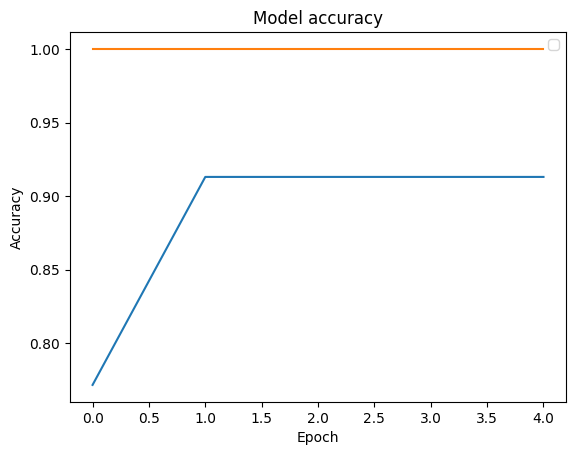

In [180]:
plt.plot(history.history["accuracy"])
plt.plot(history.history["val_accuracy"])
plt.title("Model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(loc="best")
plt.show()

In [182]:
from sklearn.metrics import classification_report

In [183]:
report = classification_report(test_images.labels,predictions)
print(report)

              precision    recall  f1-score   support

           0       1.00      0.65      0.79        49
           1       0.06      1.00      0.11         1

    accuracy                           0.66        50
   macro avg       0.53      0.83      0.45        50
weighted avg       0.98      0.66      0.78        50

